###  Set up Kaggle API and Download CelebA

In [1]:
# Upload kaggle.json first
from google.colab import files
files.upload()

# Setup Kaggle API
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip -q celeba-dataset.zip -d celeba


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.32G/1.33G [00:10<00:00, 299MB/s]
100% 1.33G/1.33G [00:10<00:00, 130MB/s]


### Setup

In [1]:
import os
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image

# Constants
IMG_SIZE = 64
BATCH_SIZE = 64
LATENT_DIM = 100
EPOCHS = 100

### Import Libraries and Preprocess Images

In [ ]:
def preprocess_celeba(image_paths, image_size=(64, 64)):
    images = []
    for img_path in image_paths:
        img = Image.open(img_path).resize(image_size).convert('RGB')
        img = np.asarray(img).astype(np.float32)
        img = (img - 127.5) / 127.5
        images.append(img)
    return np.array(images)

# Load images
image_paths = glob('celeba/img_align_celeba/img_align_celeba/*.jpg')[:50000]
data = preprocess_celeba(image_paths)
print("Shape of data:", data.shape)


Shape of data: (50000, 64, 64, 3)


### Ploting some Random Sample

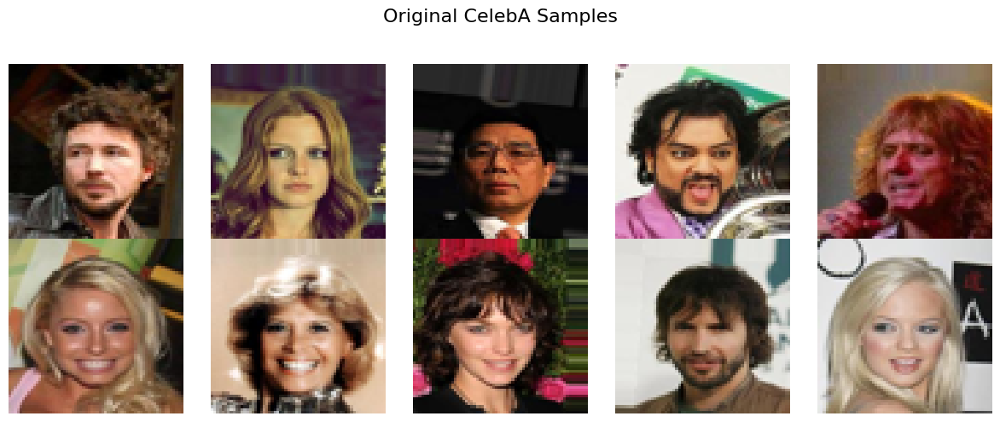

In [4]:
import matplotlib.pyplot as plt

def plot_original_samples(data, num_images=10):
    plt.figure(figsize=(12, 5))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        img = (data[i] + 1) / 2.0  # Rescale to [0, 1]
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle("Original CelebA Samples", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

plot_original_samples(data)


### DCGAN Model (Generator + Discriminator)

In [2]:
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(LATENT_DIM,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),

        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')
    ])
    return model

def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

generator = build_generator()
discriminator = build_discriminator()
generator.summary()
discriminator.summary()

c:\Users\Israil\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\Israil\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 16384)          │     1,638,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 128)    │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 3)      │         4,800 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │        32,769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

### Define Training Loop

In [ ]:
# Loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Prepare dataset
dataset = tf.data.Dataset.from_tensor_slices(data).shuffle(10000).batch(BATCH_SIZE)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


### Training + Generate Images

Epoch 1/100 | Generator Loss: 1.3196 | Discriminator Loss: 0.9891


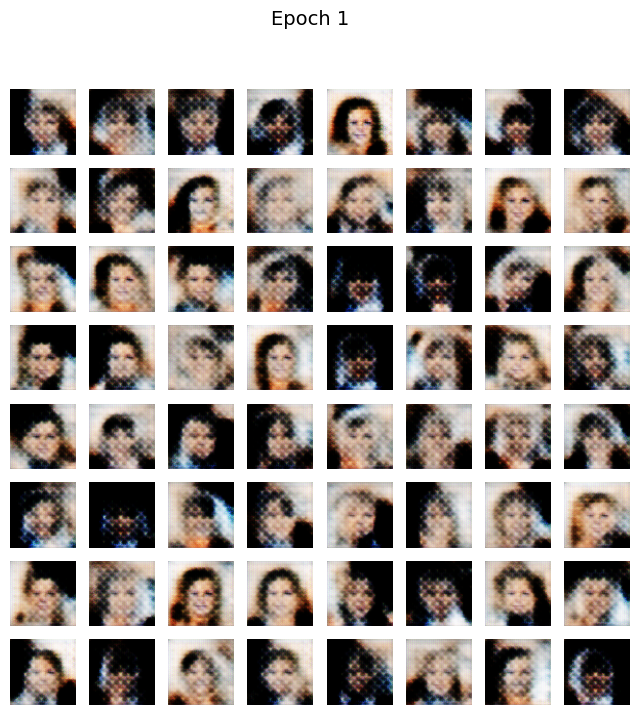

Epoch 2/100 | Generator Loss: 1.2993 | Discriminator Loss: 0.9765
Epoch 3/100 | Generator Loss: 1.3780 | Discriminator Loss: 0.9456
Epoch 4/100 | Generator Loss: 1.3661 | Discriminator Loss: 0.9434
Epoch 5/100 | Generator Loss: 1.4700 | Discriminator Loss: 0.9079


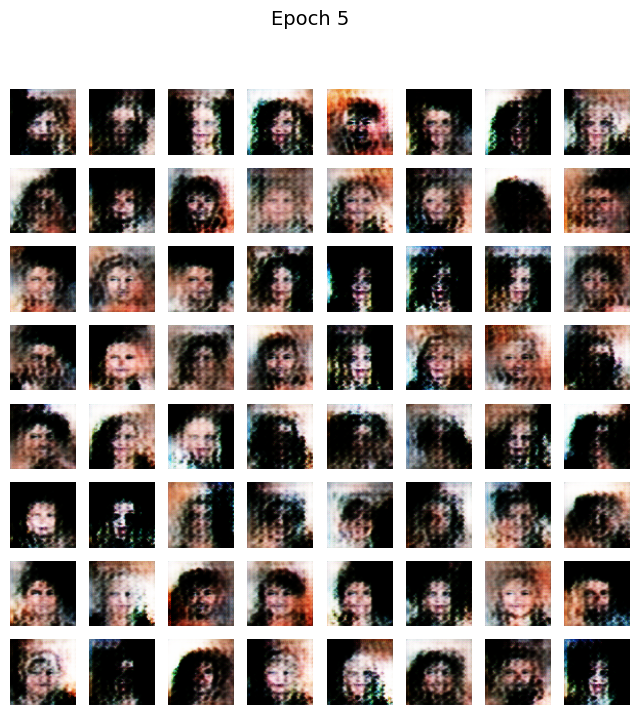

Epoch 6/100 | Generator Loss: 1.4473 | Discriminator Loss: 0.9718
Epoch 7/100 | Generator Loss: 1.4478 | Discriminator Loss: 0.9296
Epoch 8/100 | Generator Loss: 1.4697 | Discriminator Loss: 0.9161
Epoch 9/100 | Generator Loss: 1.5275 | Discriminator Loss: 0.8971
Epoch 10/100 | Generator Loss: 1.5359 | Discriminator Loss: 0.8957


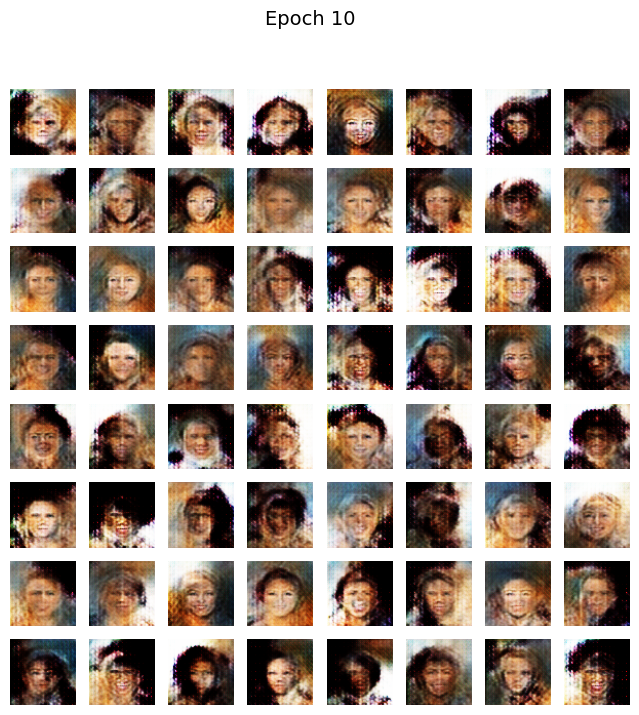

Epoch 11/100 | Generator Loss: 1.5615 | Discriminator Loss: 0.8942
Epoch 12/100 | Generator Loss: 1.5508 | Discriminator Loss: 0.9199
Epoch 13/100 | Generator Loss: 1.4258 | Discriminator Loss: 0.9981
Epoch 14/100 | Generator Loss: 1.4112 | Discriminator Loss: 0.9634
Epoch 15/100 | Generator Loss: 1.4987 | Discriminator Loss: 0.9545


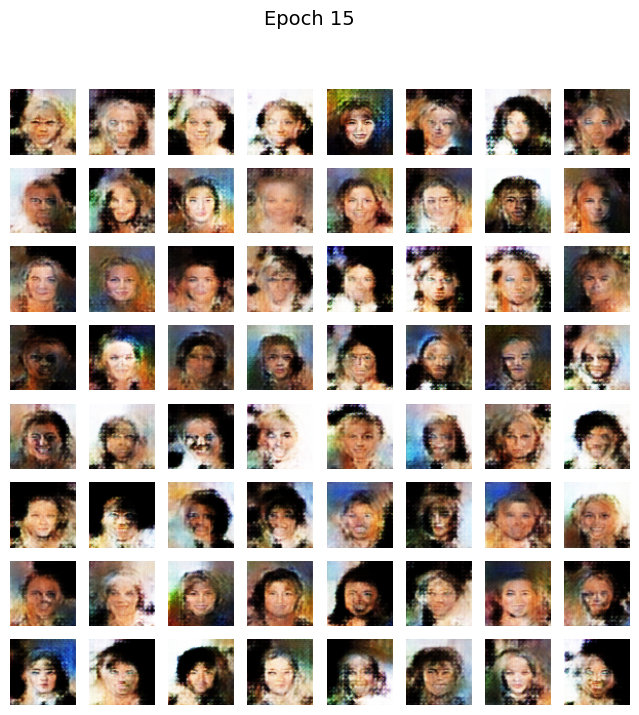

Epoch 16/100 | Generator Loss: 1.5533 | Discriminator Loss: 0.9203
Epoch 17/100 | Generator Loss: 1.5960 | Discriminator Loss: 0.8926
Epoch 18/100 | Generator Loss: 1.7007 | Discriminator Loss: 0.8312
Epoch 19/100 | Generator Loss: 1.7681 | Discriminator Loss: 0.8390
Epoch 20/100 | Generator Loss: 1.6770 | Discriminator Loss: 0.8672


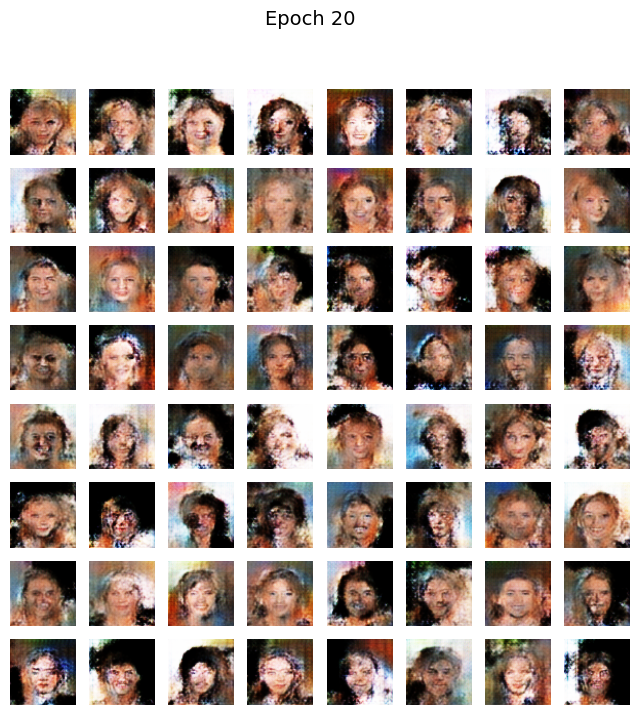

Epoch 21/100 | Generator Loss: 1.7499 | Discriminator Loss: 0.8650
Epoch 22/100 | Generator Loss: 1.7143 | Discriminator Loss: 0.8547
Epoch 23/100 | Generator Loss: 1.6994 | Discriminator Loss: 0.8753
Epoch 24/100 | Generator Loss: 1.7886 | Discriminator Loss: 0.8377
Epoch 25/100 | Generator Loss: 1.7497 | Discriminator Loss: 0.8434


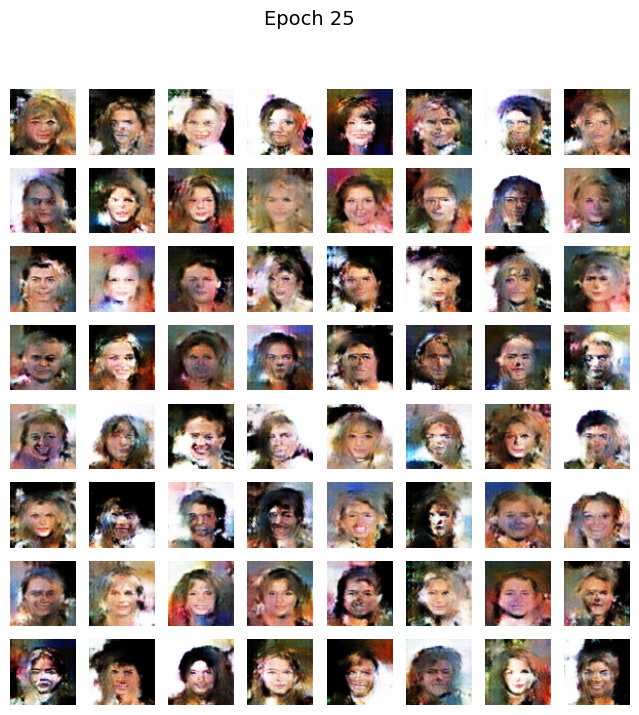

Epoch 26/100 | Generator Loss: 1.7145 | Discriminator Loss: 0.8614
Epoch 27/100 | Generator Loss: 1.7373 | Discriminator Loss: 0.8363
Epoch 28/100 | Generator Loss: 1.8187 | Discriminator Loss: 0.8215
Epoch 29/100 | Generator Loss: 1.7434 | Discriminator Loss: 0.8417
Epoch 30/100 | Generator Loss: 1.7782 | Discriminator Loss: 0.8487


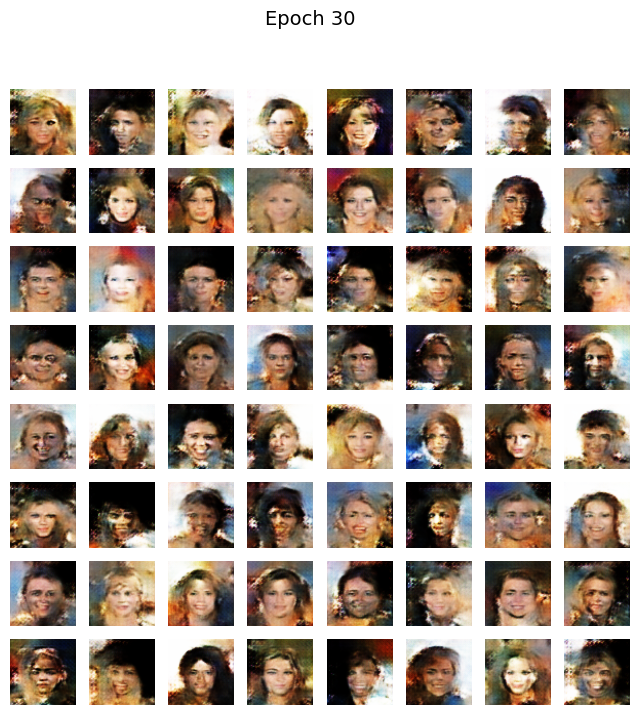

Epoch 31/100 | Generator Loss: 1.7461 | Discriminator Loss: 0.8751
Epoch 32/100 | Generator Loss: 1.6773 | Discriminator Loss: 0.8988
Epoch 33/100 | Generator Loss: 1.6407 | Discriminator Loss: 0.9138
Epoch 34/100 | Generator Loss: 1.6287 | Discriminator Loss: 0.8926
Epoch 35/100 | Generator Loss: 1.6292 | Discriminator Loss: 0.9280


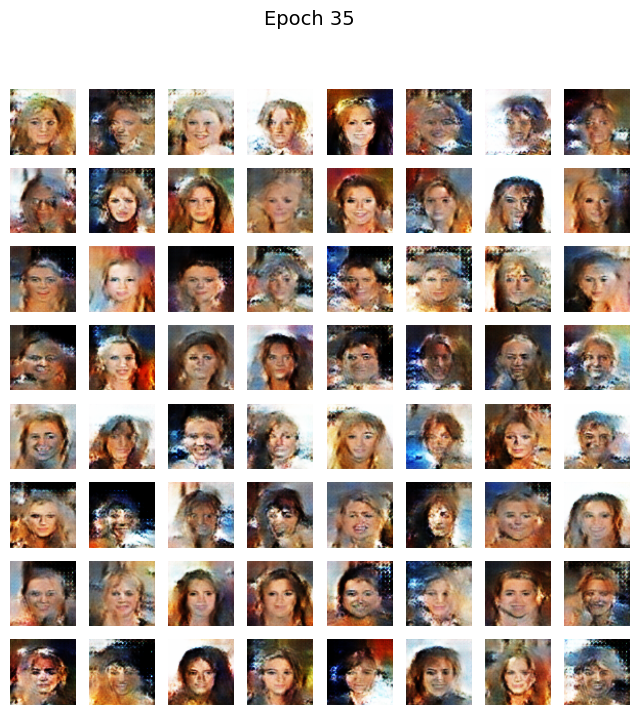

Epoch 36/100 | Generator Loss: 1.6297 | Discriminator Loss: 0.9090
Epoch 37/100 | Generator Loss: 1.6083 | Discriminator Loss: 0.9178
Epoch 38/100 | Generator Loss: 1.5702 | Discriminator Loss: 0.9325
Epoch 39/100 | Generator Loss: 1.5837 | Discriminator Loss: 0.9247
Epoch 40/100 | Generator Loss: 1.6592 | Discriminator Loss: 0.8945


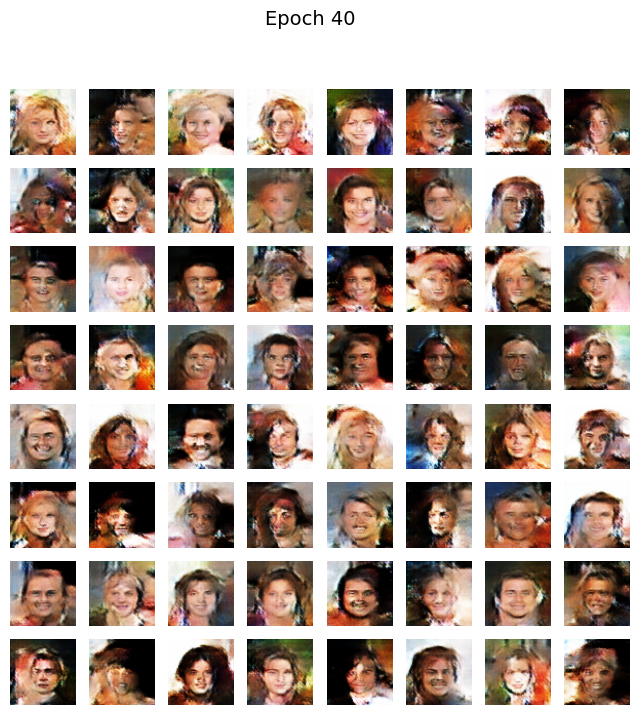

Epoch 41/100 | Generator Loss: 1.5697 | Discriminator Loss: 0.9029
Epoch 42/100 | Generator Loss: 1.6238 | Discriminator Loss: 0.8898
Epoch 43/100 | Generator Loss: 1.6056 | Discriminator Loss: 0.8917
Epoch 44/100 | Generator Loss: 1.6066 | Discriminator Loss: 0.8922
Epoch 45/100 | Generator Loss: 1.6015 | Discriminator Loss: 0.9246


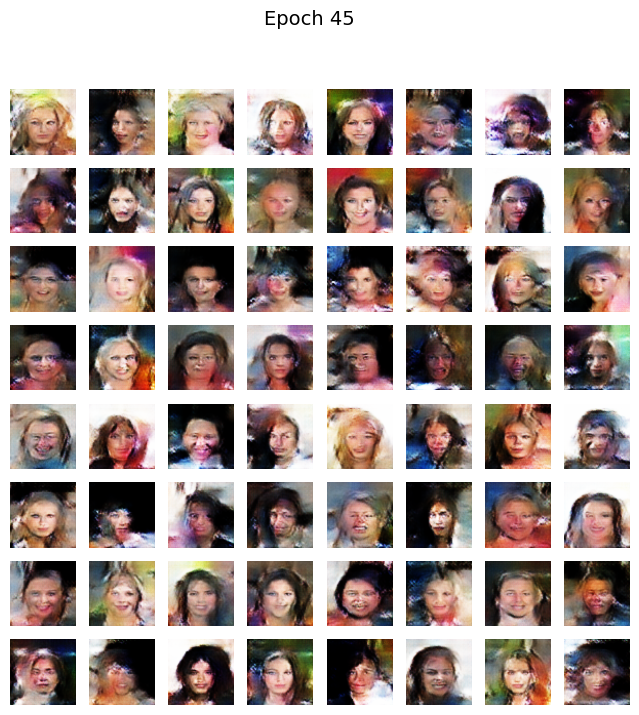

Epoch 46/100 | Generator Loss: 1.5781 | Discriminator Loss: 0.9171
Epoch 47/100 | Generator Loss: 1.6198 | Discriminator Loss: 0.8767
Epoch 48/100 | Generator Loss: 1.6138 | Discriminator Loss: 0.9035
Epoch 49/100 | Generator Loss: 1.6097 | Discriminator Loss: 0.8757
Epoch 50/100 | Generator Loss: 1.5716 | Discriminator Loss: 0.9026


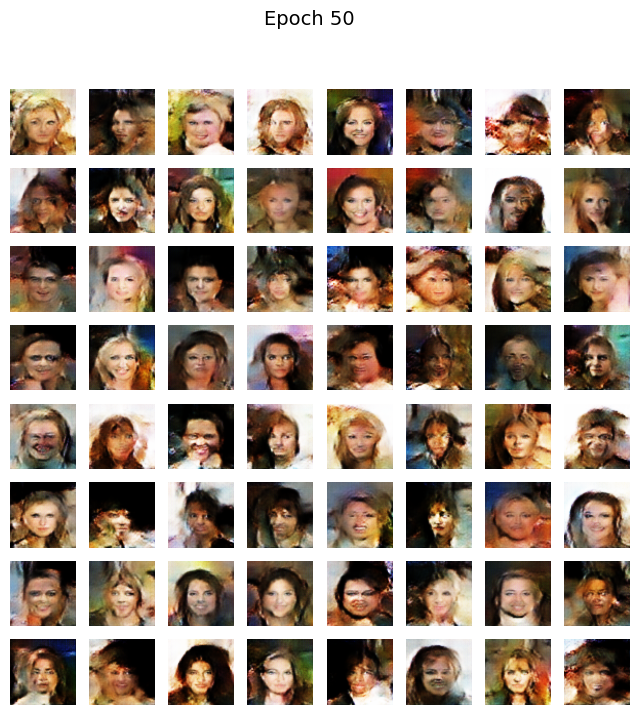

Epoch 51/100 | Generator Loss: 1.5905 | Discriminator Loss: 0.8884
Epoch 52/100 | Generator Loss: 1.5761 | Discriminator Loss: 0.8957
Epoch 53/100 | Generator Loss: 1.5751 | Discriminator Loss: 0.9016
Epoch 54/100 | Generator Loss: 1.5687 | Discriminator Loss: 0.8968
Epoch 55/100 | Generator Loss: 1.5581 | Discriminator Loss: 0.9155


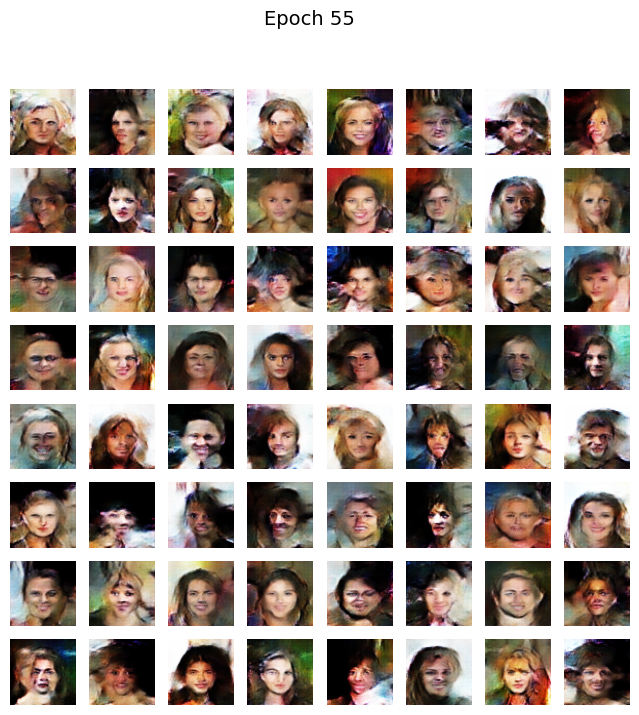

Epoch 56/100 | Generator Loss: 1.5244 | Discriminator Loss: 0.9300
Epoch 57/100 | Generator Loss: 1.5516 | Discriminator Loss: 0.9000
Epoch 58/100 | Generator Loss: 1.6708 | Discriminator Loss: 0.8600
Epoch 59/100 | Generator Loss: 1.6724 | Discriminator Loss: 0.8752
Epoch 60/100 | Generator Loss: 1.5562 | Discriminator Loss: 0.9390


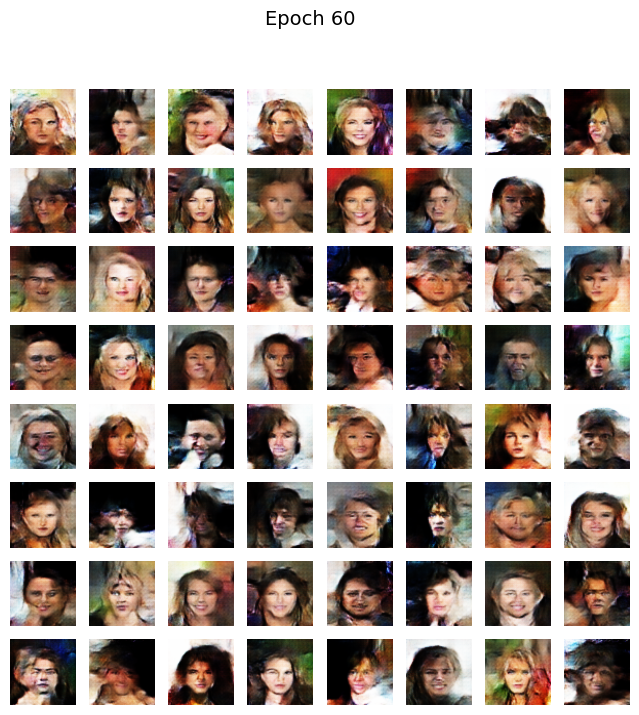

Epoch 61/100 | Generator Loss: 1.5569 | Discriminator Loss: 0.9146
Epoch 62/100 | Generator Loss: 1.6127 | Discriminator Loss: 0.9077
Epoch 63/100 | Generator Loss: 1.5808 | Discriminator Loss: 0.9097
Epoch 64/100 | Generator Loss: 1.5657 | Discriminator Loss: 0.9292
Epoch 65/100 | Generator Loss: 1.5925 | Discriminator Loss: 0.9103


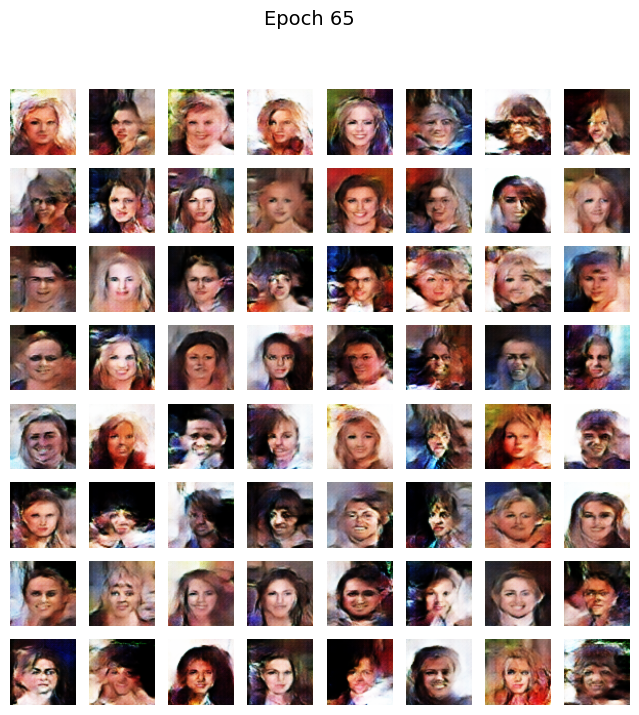

Epoch 66/100 | Generator Loss: 1.6191 | Discriminator Loss: 0.9025
Epoch 67/100 | Generator Loss: 1.5817 | Discriminator Loss: 0.9134
Epoch 68/100 | Generator Loss: 1.5556 | Discriminator Loss: 0.9005
Epoch 69/100 | Generator Loss: 1.6536 | Discriminator Loss: 0.8857
Epoch 70/100 | Generator Loss: 1.6008 | Discriminator Loss: 0.9040


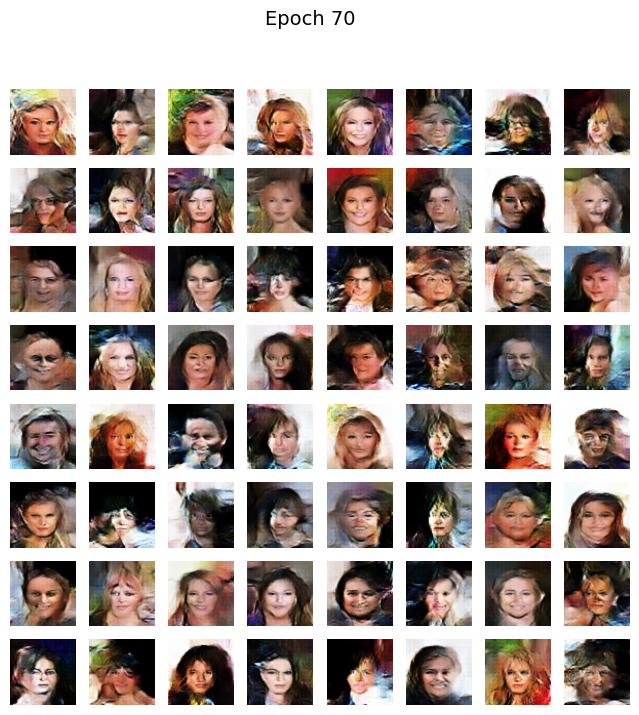

Epoch 71/100 | Generator Loss: 1.5382 | Discriminator Loss: 0.9264
Epoch 72/100 | Generator Loss: 1.4936 | Discriminator Loss: 0.9441
Epoch 73/100 | Generator Loss: 1.6076 | Discriminator Loss: 0.8910
Epoch 74/100 | Generator Loss: 1.5773 | Discriminator Loss: 0.8867
Epoch 75/100 | Generator Loss: 1.5775 | Discriminator Loss: 0.8944


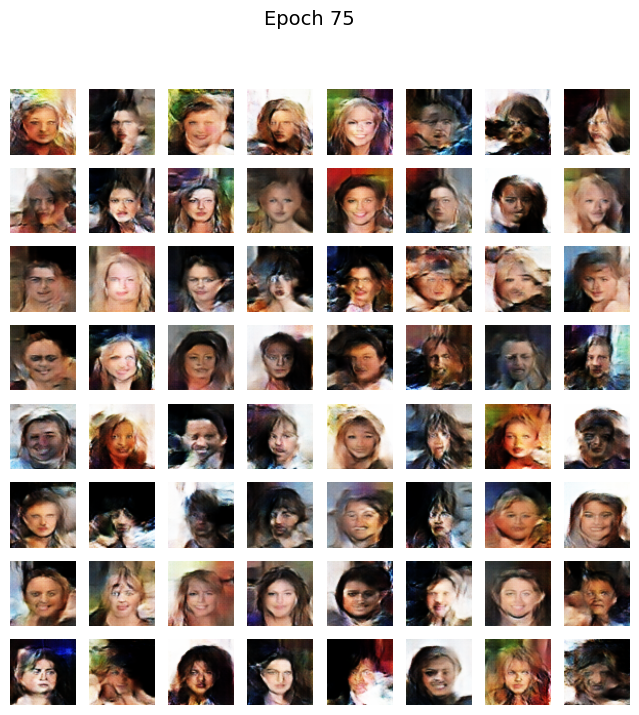

Epoch 76/100 | Generator Loss: 1.5595 | Discriminator Loss: 0.9109
Epoch 77/100 | Generator Loss: 1.6075 | Discriminator Loss: 0.8769
Epoch 78/100 | Generator Loss: 1.5701 | Discriminator Loss: 0.8926
Epoch 79/100 | Generator Loss: 1.6376 | Discriminator Loss: 0.8759
Epoch 80/100 | Generator Loss: 1.5267 | Discriminator Loss: 0.9089


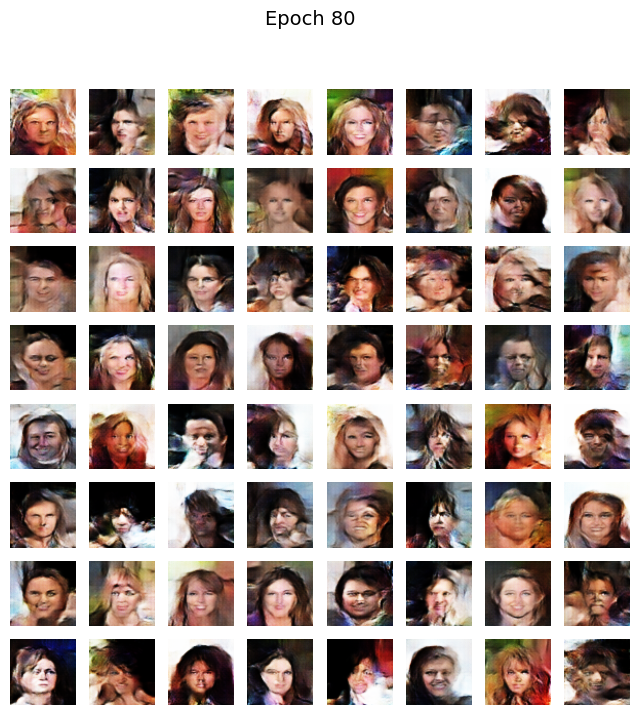

Epoch 81/100 | Generator Loss: 1.5603 | Discriminator Loss: 0.9001
Epoch 82/100 | Generator Loss: 1.6172 | Discriminator Loss: 0.8708
Epoch 83/100 | Generator Loss: 1.5685 | Discriminator Loss: 0.8947
Epoch 84/100 | Generator Loss: 1.5425 | Discriminator Loss: 0.9020
Epoch 85/100 | Generator Loss: 1.6145 | Discriminator Loss: 0.8776


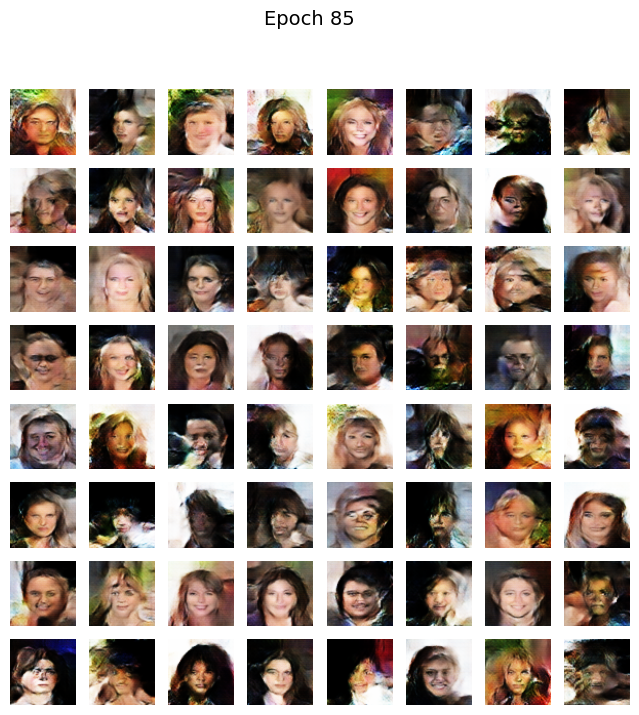

Epoch 86/100 | Generator Loss: 1.5618 | Discriminator Loss: 0.9104
Epoch 87/100 | Generator Loss: 1.5333 | Discriminator Loss: 0.9093
Epoch 88/100 | Generator Loss: 1.5634 | Discriminator Loss: 0.8970
Epoch 89/100 | Generator Loss: 1.6172 | Discriminator Loss: 0.8725
Epoch 90/100 | Generator Loss: 1.5985 | Discriminator Loss: 0.8832


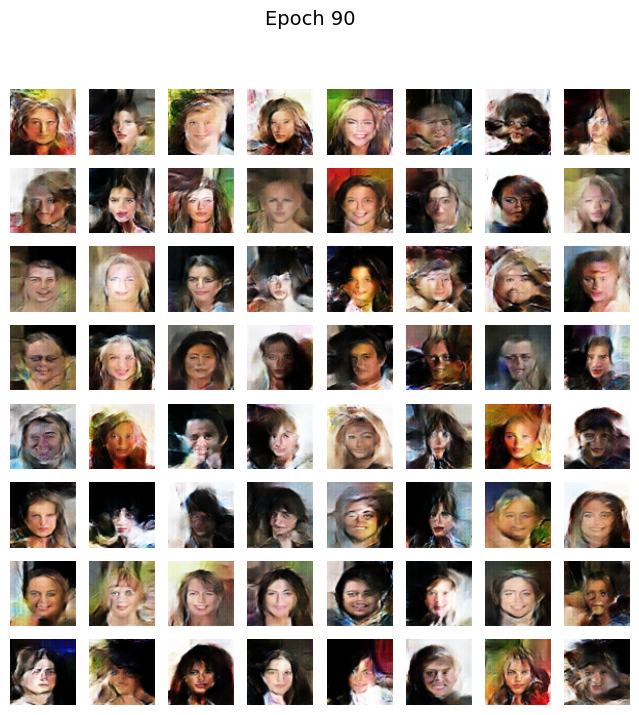

Epoch 91/100 | Generator Loss: 1.5068 | Discriminator Loss: 0.9227
Epoch 92/100 | Generator Loss: 1.6592 | Discriminator Loss: 0.8624
Epoch 93/100 | Generator Loss: 1.5513 | Discriminator Loss: 0.8875
Epoch 94/100 | Generator Loss: 1.6253 | Discriminator Loss: 0.8837
Epoch 95/100 | Generator Loss: 1.5099 | Discriminator Loss: 0.9293


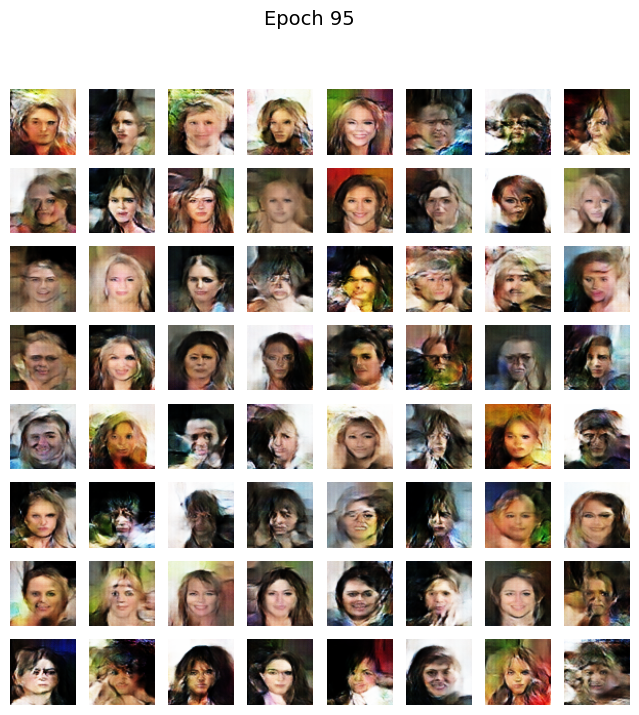

Epoch 96/100 | Generator Loss: 1.5746 | Discriminator Loss: 0.8935
Epoch 97/100 | Generator Loss: 1.5547 | Discriminator Loss: 0.8887
Epoch 98/100 | Generator Loss: 1.5621 | Discriminator Loss: 0.8899
Epoch 99/100 | Generator Loss: 1.6241 | Discriminator Loss: 0.8718
Epoch 100/100 | Generator Loss: 1.5530 | Discriminator Loss: 0.8896


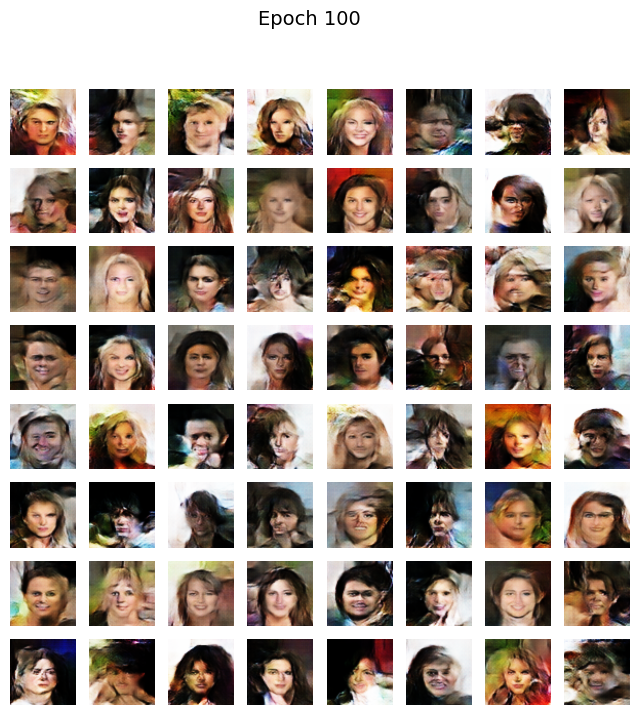

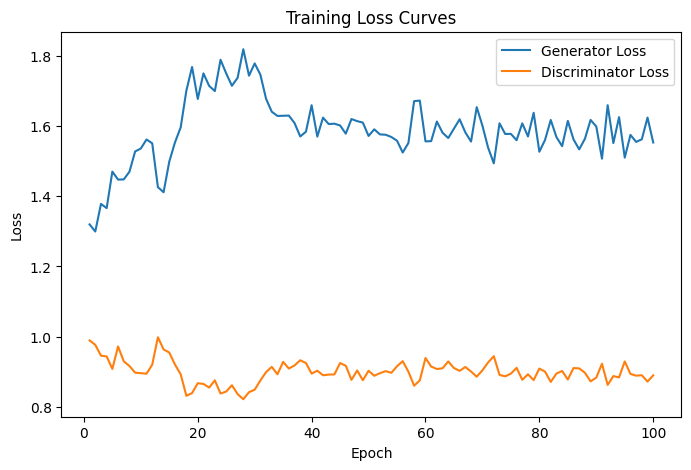

In [8]:
# For tracking losses and best epoch
gen_losses = []
disc_losses = []

seed = tf.random.normal([64, LATENT_DIM])

def generate_and_plot_images(model, epoch, test_input, save=False):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1) / 2.0  # Rescale to [0, 1]

    fig = plt.figure(figsize=(8, 8))
    for i in range(predictions.shape[0]):
        plt.subplot(8, 8, i + 1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f'Epoch {epoch}', fontsize=14)
    plt.show()

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, LATENT_DIM]) # (noise shape = images shape)

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True) #forward pass

        real_output = discriminator(images, training=True) #forward pass
        fake_output = discriminator(generated_images, training=True) #forward pass

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

def train(dataset, epochs):
    for epoch in range(1, epochs + 1):
        epoch_gen_loss = 0.0
        epoch_disc_loss = 0.0
        batch_count = 0

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
            epoch_gen_loss += gen_loss.numpy()
            epoch_disc_loss += disc_loss.numpy()
            batch_count += 1

        avg_gen_loss = epoch_gen_loss / batch_count
        avg_disc_loss = epoch_disc_loss / batch_count

        gen_losses.append(avg_gen_loss)
        disc_losses.append(avg_disc_loss)

        print(f"Epoch {epoch}/{epochs} | Generator Loss: {avg_gen_loss:.4f} | Discriminator Loss: {avg_disc_loss:.4f}")

        # Show generated images every 5 epochs
        if epoch % 5 == 0 or epoch==1:
            generate_and_plot_images(generator, epoch, seed)

    # Plot training loss curves
    plt.figure(figsize=(8, 5))
    plt.plot(range(1, epochs + 1), gen_losses, label='Generator Loss')
    plt.plot(range(1, epochs + 1), disc_losses, label='Discriminator Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Curves')
    plt.legend()
    plt.show()

train(dataset, EPOCHS)
